<a href="https://colab.research.google.com/github/rashmivalsala/dog_vision_classification/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end to end multiclass image classifier using TensorFlow 2.0 and TensorFlow hub.

## Problem

Identifying the breed of a dog, given the image of the dog

When I'm sitting at the cafe and take the picture of the dog, I want to know what breed of dog it is

## Data

Data we are using is from Kaggle's dog breed identification competition

https://www.kaggle.com/c/dog-breed-identification/data

## Evaluation

The evaluation is file with prediction probabilities for each dog breed of each test image

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## Features

Some information about the data:
* We are dealing with images (unstructured data) so its best we use deep learning/transfer learning
* There are 120 breeds of dogs(this means there are 120 different classes).
* There are around 10,000+ images in the training set(these images have labels)
* There are around 10,000+ images in the test set(these images have no labels because we'll want to predict them).

### Get our workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow hub.
* Make sure we're using GPU

In [ ]:
#Import TensorFlow into colab

import tensorflow as tf
import tensorflow_hub as hub

print('TensorFlow version', tf.__version__)
print('TensorFlow Hub version', hub.__version__)

#Check GPU availability
print('GPU', 'available (Yesss!!!!!)' if tf.config.list_physical_devices('GPU') else 'Not available :(')


TensorFlow version 2.8.0
TensorFlow Hub version 0.12.0
GPU available (Yesss!!!!!)


# Getting data ready(turning into Tensors)
With all machine learning models, all the data should be in numerical format. 
Turning our images into Tensors(numberical representation).

Let's start by accessing our data and checking out labels.

In [ ]:
#Checkout data in our labels
import pandas as pd
import numpy as np

labels_csv = pd.read_csv('/content/drive/MyDrive/Dog Vision/labels.csv')

print(labels_csv.describe())


                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


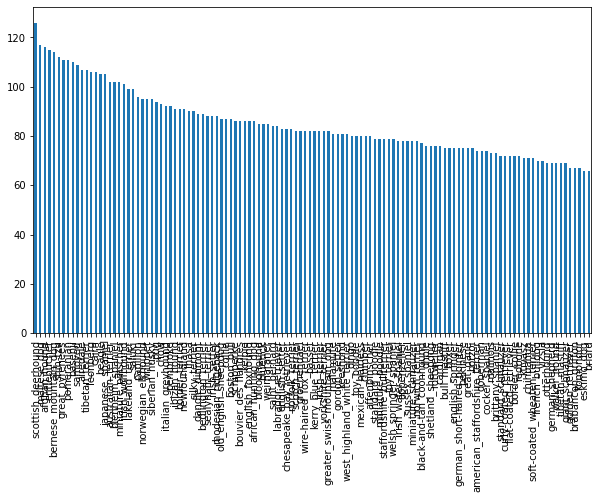

In [ ]:
#How many images are there of each breed?
labels_csv['breed'].value_counts().plot.bar(figsize=(10,6))

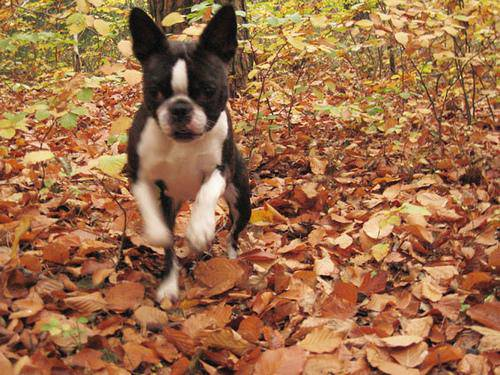

In [ ]:
#Let's view an Image
from IPython.display import Image
Image('/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

#Getting images and their labels

Let's get a list of all our images file path

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#Create filepath for Image Id's
filenames = ['/content/drive/MyDrive/Dog Vision/train/' + fname + '.jpg' for fname in labels_csv['id']]

#check the first 10
filenames[:10]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#check if the filename matches actual images
import os
if len(os.listdir('/content/drive/MyDrive/Dog Vision/train')) == len(filenames):
  print('Filenames match actual amount of files!!! Proceed.')
else:
  print('Filenames do not match actual amount of files, check the target directly.')



NameError: ignored

In [ ]:
import os
os.listdir('/content/drive/MyDrive/Dog Vision/train')[:10]

['dcaa788b4a781d17cfa724b27d7c51fd.jpg',
 'e82fa6e85fd570b2f766635eed62fdf4.jpg',
 'dc1c430fe26e231d4c8e13d2ee14c5ad.jpg',
 'dd4449d7083cbce6c5dbc4d66091652d.jpg',
 'e6817d4d0b53ec2dc5339166bcb167c0.jpg',
 'de1f5f90eed51d8229d197a91d35f4d4.jpg',
 'e316925eb1cf7cdeb1ffaab7424e231d.jpg',
 'e7f3274adaad369068602a422e9df192.jpg',
 'e996b051ab78dd47c2ca379c70b6f27b.jpg',
 'e993788050a70ef538c396f582c3a04c.jpg']

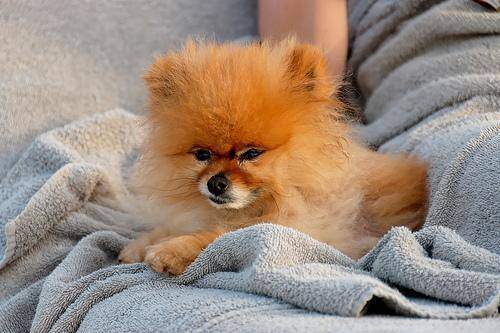

In [ ]:
#One more check
Image(filenames[8000])

In [ ]:
labels_csv['breed'][8000]

'pomeranian'

#Since we have got our training image path let's prepare our labels

In [ ]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
#Check if number of labels is same as filepath
if len(labels) == len(filenames):
  print('Yes number of labels is same as filepath')
else:
  print('Not the same')  

Yes number of labels is same as filepath


In [ ]:
#Find the unique values for labels
unique_labels = np.unique(labels)
len(unique_labels)

120

In [ ]:
#Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_labels



boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every single label into boolean values
boolean_labels = [label == unique_labels for label in labels ]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
#Example: turning boolean values into integers
print(labels[0]) #first label
print(np.where(labels[0] == unique_labels)) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occus

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from kaggle does not provide with the validation set, let's create our own

In [ ]:
#Set up X and y
X= filenames
y = boolean_labels

We're going to start with 1000 images and increase as needed 

In [ ]:
#Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type: 'slider', min: 1000, max: 10000, step: 1000}

In [ ]:
#Lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], 
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)


In [ ]:
#check the length of the data after splitting
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

#Preprocessing images(turning images into Tensors)

To preprocess our images, we are going to write function
which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a 
variable `image`
3. Turn our images into tensors
4. Resize our images to be a shape of(224, 224)
5.Return the modified images

#Before we do lets see what importing an image looks like


In [ ]:
#Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape


NameError: ignored

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
#turn images into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now that we have seen our images as Tensors
let's build our function to preprocess image

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable image
3. Turn our images into tensors
4. Normalize our image(convert colour channels from 0-255 to 0-1)
5. Resize our images to be a shape of(224, 224)
6. Return the modified images

In [ ]:
#Define image size
IMG_SIZE=224

# Create a function for preprocessing image
def preprocess_image(image_path):
  """
    Takes an image path and turns it into tensor
  """
  #Read in an image file
  image = tf.io.read_file(image_path)

  #Return the jpeg image into numerical tensor with colour channels(RED BLUE GREEN)
  image = tf.image.decode_jpeg(image, channels=3)

  #Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  #Resize the image to our desired value(224, 224)
  image = tf.image.resize(image, size=(IMG_SIZE,IMG_SIZE))

  return image 
  

In [ ]:
#preprocess_image()

## Turning our data into batches

Why turn our data into batches?

Let's say your are trying to process 10,000+ images in one go... they will not fit in the memory

So that is why we take 32 (batch size) images at a time(you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which looks like this:
`(image, label)`

In [ ]:
#Create a simple function that return a tuple(image, label)

def get_image_label(image_path, label):
  '''
  Take an image file path name and associated label
  process the image and return a tuple of image, label 
  '''
  image = preprocess_image(image_path)
  return image, label



In [ ]:
(preprocess_image(X[42]), y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, lets make a function to turn all our data `(X, y)` into batches 

In [ ]:
#Define the batch size, 32 its a good start
BATCH_SIZE = 32

#Create a function to turn our data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):  
  '''
  Creates batches of data out of image(X) and lebel (y) pairs.
  Shuffles the data if its training data but does not shuffle if its validation data
  Also accepts test data as input (no labels) 
  '''
  #If the data is a test dataset then we do not have labels
  if test_data:
    print('creating test data batches....')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #If data is a valid dataset then we do not need to shuffle it
  elif valid_data:
    print('Creating valid data batches....')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                              tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE) 
    return data_batch
  
  else:
    print('Creating training data batches...')
    #Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
    
    #Shuffling pathnames and labels before mapping image processor function is faster
    #than shuffling images
    data = data.shuffle(buffer_size = len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
  return data_batch




In [ ]:
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating valid data batches....


In [ ]:
#Checkout different attributes of our data batches
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, lets visualize them  

In [ ]:
#import matplotlib 
import matplotlib.pyplot as plt

#Create a function for viewing images in data batch
def show_25images(images, labels):
  '''
  Displays a plot of 25 images and their labels from a data batch

  '''
  #Set up the figure
  plt.figure(figsize=(10,10))

  #loop through 25(5 rows and 5 columns)
  for i in range(25):
    #Create subplots
    ax = plt.subplot(5, 5, i+1)

    #Display an image
    plt.imshow(images[i])

    #Dispaly title
    plt.title(unique_labels[labels[i].argmax()])

    #Turn the grid lines off
    plt.axis('off')


In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

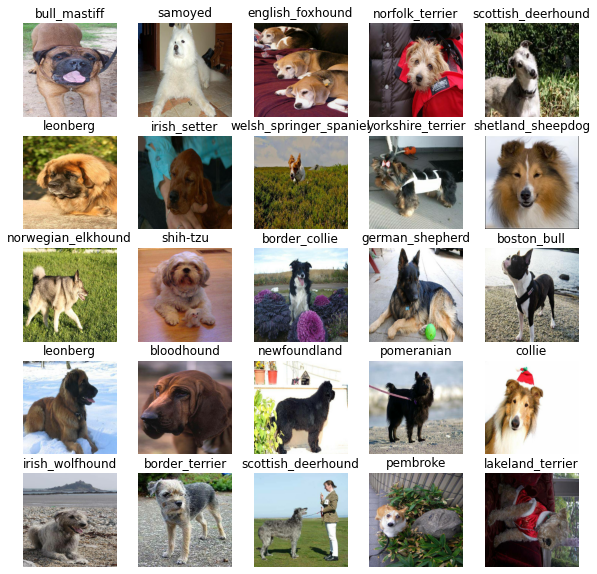

In [ ]:
show_25images(train_images, train_labels)

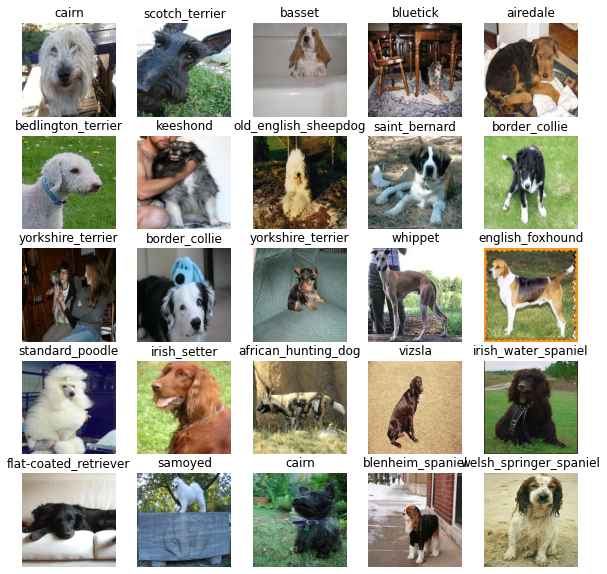

In [ ]:
#Lets visualize validation data
val_images, val_labels = next(valid_data.as_numpy_iterator())
show_25images(val_images, val_labels)

## Building our model

Before we build a model, there are few things that we need to define
* The input shape(our images shape in the form of Tensors) to our model
* The output shape(oul labels, in the form of Tensors) of our model
* The URL of the model that we want to use

In [ ]:
#Setup input shape to our model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channel

#Setup output shape to our model
OUTPUT_SHAPE = len(unique_labels)

#Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4'

NameError: ignored

Now that we have got our input, output and model ready to go. Lets put them together into a Keras deep learning model!

Knowing this, lets create a function whcih:
* Takes the input shape, output shape and the model we have choosen as parameters
* Defines the layer in a Keras model in sequenial fashion(do this first, then this, then that)
* Compiles the model(says it should be evaluated and improved)
* Builds the model(tells the model the input shape it will be getting)
* Returns the model

All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview



In [ ]:
#create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url= MODEL_URL):
  '''
  This model is used for buiding a Keras model
  '''
  print('Building a model', MODEL_URL)

  #Setup the model layer
  model = tf.keras.Sequential([
     hub.KerasLayer(MODEL_URL), #Layer 1
     tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                           activation='softmax') #Layer 2 (output layer)
  ])

  #compile the model
  model.compile(
      loss= tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  model.build(INPUT_SHAPE)

  return model 


In [ ]:
model = create_model()
model.summary()

Building a model https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks

Callbacks are helper function that model can use during training to do such things as save its process, check its process or stop training early if model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training too long.

## TensorBoard Callbacks

To setup a TensorBoard callback, we need to 3 things:
1. Load the TensorBoard notebook extension ✅
2. Load the TensorBoard callback which is able to save logs to a directory and pass it to our model using function `fit()` function
3. Visualize our models training logs with the `%tensorboard` magic function(we'll do this after model training)


In [ ]:
#Load Tensorboard notebook extension
%load_ext tensorboard


In [ ]:
import datetime

#Create a function to build TensorBoard callback
def create_tensorboard_callbacks():
  #Create a log directory to for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/Dog Vision/logs',
                       #make it so the logs get trackes whenever we run an experiment
                        datetime.datetime.now().strftime('%Y/%m/%d-%H:%M:%S')
  ) 
  return tf.keras.callbacks.TensorBoard(logdir)
  
                       


## Early stopping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metrics has stopped improving

In [ ]:
#Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)


# Training a model on subset of data
 
 Our model is going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {types: "slider", min:10, max:100, steps:10}


In [ ]:
#Check to make sure that we are using GPU
print("GPU", "available (YES!!!!)" if tf.config.list_physical_devices("GPU") else "not available" )

GPU available (YES!!!!)


# Lets create a function that trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it training data, validation data, number of epochs(NUM_EPOCHS) and the callbacks we'd like to use
* Return the model


In [ ]:
#Build a function to train a model and return the trained model
def train_model():
  '''
  Train a given model and return the trained version   
  ''' 
  
  #Create a model
  model = create_model()
  
  #Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callbacks()
  
  #Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping] 
            )
  
  #return the fitted model
  return model 

In [ ]:
#Fit the model to the data
model = train_model()

Building a model https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 169s 6s/step - loss: 4.5814 - accuracy: 0.0887 - val_loss: 3.5299 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 5s 181ms/step - loss: 1.6316 - accuracy: 0.6950 - val_loss: 2.2629 - val_accuracy: 0.4400
Epoch 3/100
25/25 [==============================] - 5s 192ms/step - loss: 0.5635 - accuracy: 0.9413 - val_loss: 1.7874 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 5s 185ms/step - loss: 0.2529 - accuracy: 0.9900 - val_loss: 1.6086 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 5s 184ms/step - loss: 0.1485 - accuracy: 0.9962 - val_loss: 1.5361 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 5s 195ms/step - loss: 0.1012 - accuracy: 0.9987 - val_loss: 1.4946 - val_accuracy: 0.6350
Epoch 7/100
25/25 [==============================] - 5

*What are the some  ways that we can prevent overfitting in a deep learning neural network?

**Note** - Overfitting to begin with is a good thing! it means our model is learning!!!

#Checking the TensorBoard logs

The TensorBoard magic function(%tensorboard) will access the logs that we created earlier 

In [ ]:
##Checking the TensorBoard logs
#The TensorBoard magic function(%tensorboard) will access the logs that we created earlier 

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ Vision/logs/

<IPython.core.display.Javascript object>

#Making and Evaluating predictions using a trained model 

In [ ]:
valid_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#Make prediction on the validation data(not used for training)
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 2s 159ms/step


array([[4.91020363e-03, 9.78367389e-05, 5.67759380e-05, ...,
        1.16566906e-03, 6.20330902e-05, 1.32904504e-03],
       [3.11199762e-03, 8.25124735e-05, 2.43249610e-02, ...,
        3.16855410e-04, 2.50677299e-03, 2.60967121e-04],
       [1.56518465e-04, 5.03225419e-05, 4.08304732e-05, ...,
        2.75058774e-05, 2.49341410e-05, 8.26795818e-04],
       ...,
       [1.77018192e-05, 5.14344611e-05, 3.39623002e-05, ...,
        8.55067119e-05, 3.55382566e-04, 3.44049069e-04],
       [9.08259489e-03, 1.05048312e-04, 3.09811112e-05, ...,
        2.31010985e-04, 9.43809137e-05, 1.10127125e-02],
       [4.21169476e-04, 3.55796685e-04, 1.86540501e-03, ...,
        4.56818240e-03, 5.27622923e-03, 1.85599391e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
#sum of the predictions should be close to 1
np.sum(predictions[0])

1.0

In [ ]:
np.sum(predictions[1])

1.0

In [ ]:
#First prediction
index=0
print(f'Max value (probability of prediction):', np.max(predictions[index]))
print(f'Sum:', np.sum(predictions[index]))
print(f'Max index:', np.argmax(predictions[index]))
print(f'Predicted label:', unique_labels[np.argmax(predictions[index])])


Max value (probability of prediction): 0.27744612
Sum: 1.0
Max index: 17
Predicted label: border_terrier


In [ ]:
unique_labels

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

Having the above functionality is great but we want to be able to do it at scale 

And it would be even better if we could see the image the prediction is made on

**Note:** prediction probabilities are also known as confidence level

In [ ]:
#Turn prediction probabilities into their respective labels(easier to understand)
def get_pred_labels(prediction_labels):
  '''
  Turn predction probabilities array into label
  '''
  return unique_labels[np.argmax(prediction_labels)]

  

In [ ]:
get_pred_labels(predictions[90])

'english_foxhound'

Now since our validation label is still in batch dataset, we will have to unbatchify it to make predictions on the images and prepare those images to the validation labels


In [ ]:
#Create a function to unbatch dataset
def unbatchify(data):
  '''
  Take a batch of data and unbatches it into images and labels
  '''
  images = []
  labels = []

  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(label)

  return images, labels

In [ ]:
val_images, val_labels = unbatchify(valid_data)

In [ ]:
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_labels(val_labels[9])

'border_collie'

Now that we have got ways to get:
* Prediction labels
* Validation labels
* Validation images

Lets make a function to make them visualize

We'll create a function which:
* Takes an array of prediction probabilities, array of truth label, and an array of images and integers
* Convert the prediction probabilities into labels.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  View the prediction, ground truth, image for sample n  
  '''
  pred_prob, true_label, image = prediction_probabilities[n], unique_labels[labels[n]], images[n]

  #Get the predicted label
  pred_label = get_pred_labels(pred_prob)
  
  #Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])  

  #Change colour of the true label and predicted label
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'  

  #Change plot title to be predicted, probability of prediction and truth label
  plt.title("{}, {:2.0f}%, {}".format(pred_label, np.max(pred_prob)*100, true_label),
                                      color = color)                                    

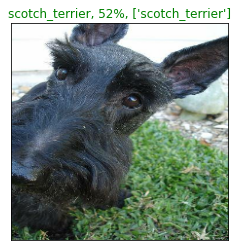

In [ ]:
plot_pred(prediction_probabilities = predictions, labels = val_labels, images = val_images)  

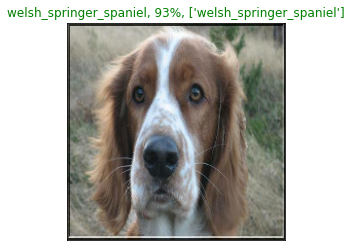

In [ ]:
plot_pred(prediction_probabilities = predictions, labels = val_labels, images = val_images, n=36) 

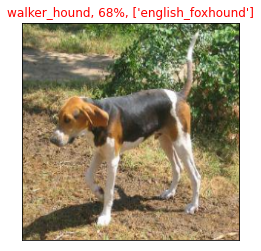

In [ ]:
plot_pred(prediction_probabilities = predictions, labels = val_labels, images = val_images, n=42) 

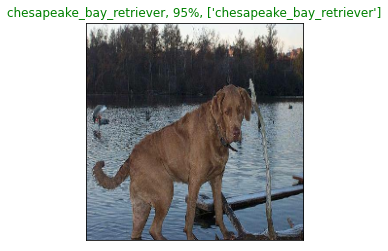

In [ ]:
plot_pred(prediction_probabilities = predictions, labels = val_labels, images = val_images, n=58) 

Now that we have got a function to visualize one prediction, lets create another to view our models top 10 predictions

This function will:
* this function will take an array of predictions, ground truth array and integer
* Find the predictions using `get_pred_labels()`
* Find the top 10
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probabilities values and labels, coloring the true label green



In [ ]:
def plot_pred_conf(prediction_probabilities, true_labels, n=1):
  '''
  Plus the top 10 highest prediction confidences along with the truth label for sample n
  '''
  pred_prob, true_label = prediction_probabilities[n], unique_labels[true_labels[n]]
  
  #get the predicted label
  pred_label = get_pred_labels(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  #Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  #Find the top 10 prediction labels
  top_10_pred_labels = unique_labels[top_10_pred_indexes]

  #plot the graph
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color='grey')

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels='Top 10 label predictions',
             rotation='vertical')
  
  #Change colour of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass  

In [ ]:
predictions[0].argsort()[-10:][::-1] #top 10 indexes

array([ 17,  26,  59,   6,  70, 109,  73, 102, 116,  35])

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]] #top 10 predictions

array([0.27744612, 0.22626054, 0.06782725, 0.0586495 , 0.04961174,
       0.04417473, 0.04241678, 0.04050435, 0.0244834 , 0.0242757 ],
      dtype=float32)

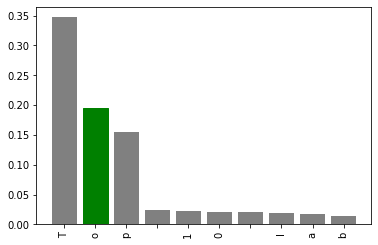

In [ ]:
plot_pred_conf(predictions, val_labels, n=9)

In [ ]:
val_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
val_labels[9]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
predictions[9]


array([8.8223338e-04, 3.0153613e-03, 7.6952441e-05, 3.0522348e-05,
       4.4207186e-03, 1.6714927e-02, 8.7588845e-04, 1.9186882e-02,
       3.1504735e-06, 4.8554130e-04, 1.2786734e-04, 1.9193653e-03,
       1.5453812e-04, 6.1495736e-04, 6.3003466e-04, 3.8003124e-04,
       1.9580494e-01, 1.6950894e-04, 1.1013534e-03, 2.2483491e-03,
       6.2448751e-05, 1.3751919e-04, 9.0928457e-05, 4.3427970e-04,
       2.0412021e-04, 9.8744687e-04, 6.6623594e-05, 6.1946199e-03,
       4.8902433e-04, 4.3588170e-04, 1.9558826e-03, 4.6456527e-04,
       5.9918766e-03, 3.4721527e-01, 3.8548463e-04, 3.4251073e-04,
       1.8179664e-04, 5.9392914e-04, 1.5357881e-03, 5.1238580e-04,
       3.5925228e-03, 5.7820656e-04, 3.3597380e-03, 4.6576085e-03,
       2.1617832e-03, 6.6559704e-05, 1.1818035e-03, 3.9881456e-04,
       4.5167888e-04, 4.3153157e-03, 9.9771598e-05, 2.0242371e-03,
       1.4753544e-02, 8.3145895e-04, 7.4654263e-03, 7.7986572e-04,
       1.7026339e-04, 3.5193129e-04, 2.8149656e-04, 3.9437332e

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  # This is added back by InteractiveShellApp.init_path()


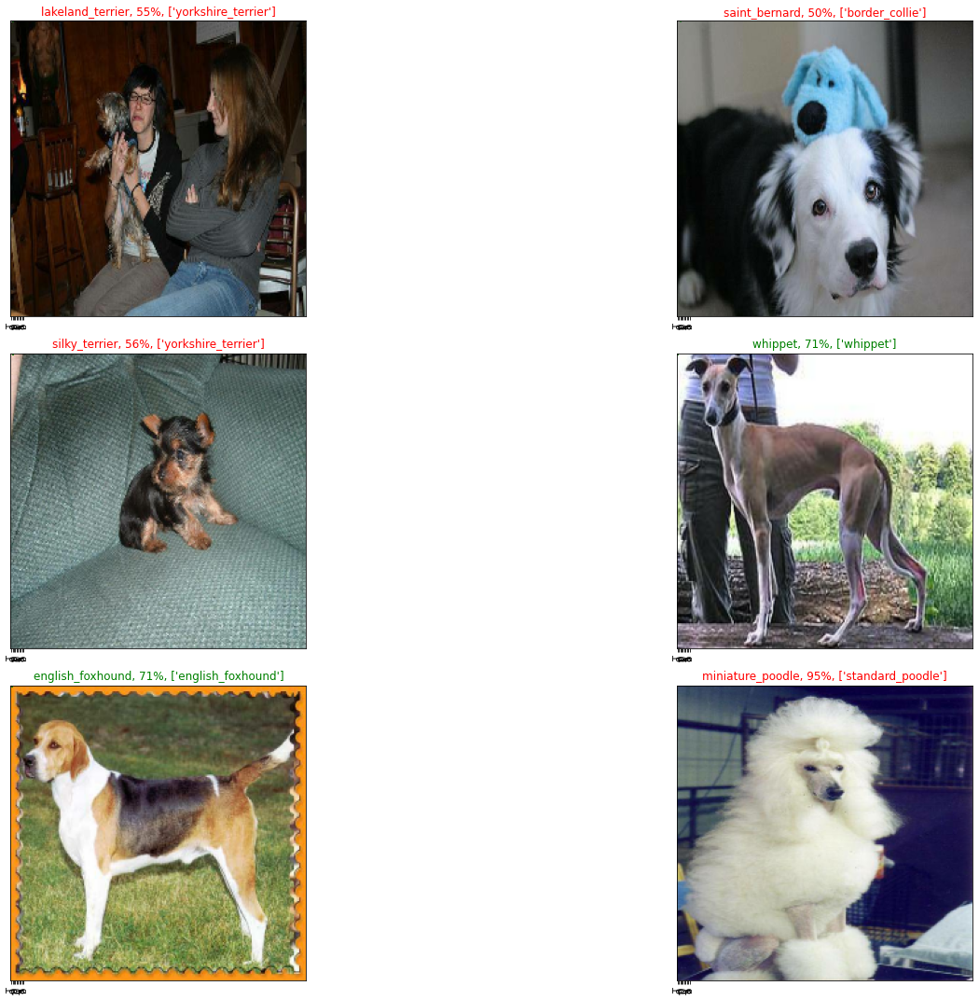

In [ ]:
#Lets checkout few predictions and their different values
i_multiplier = 10
num_rows = 3
num_columns = 2
num_images = num_rows * num_columns
plt.figure(figsize=(10*num_columns, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_columns, 2*i+1)
  plot_pred(prediction_probabilities=predictions, labels=val_labels, images= val_images, n=i+i_multiplier)

  plt.subplot(num_rows, 2*num_columns, 2*i+1)
  plot_pred_conf(prediction_probabilities=predictions, true_labels=val_labels, n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

#Saving and reloading our trained model


In [ ]:
#Create a function to save model
def save_model(model, suffix=None):
  '''
  Saves a given model in a models directory and appends a suffix(string)
  '''
  #Create a model directory path name with current time
  model_dir = os.path.join('/content/drive/MyDrive/Dog Vision', datetime.datetime.now().strftime('%Y/%d/%m/-%H%M%S'))

  model_path = model_dir + '_' + suffix + '.h5'

  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
#Create a function to load a trained model
def load_model(model_path):
  '''
  Loads a saved model from a specified path
  '''
  print(f"Loading a saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path, custom_objects={'KerasLayer': hub.KerasLayer}) 
  return model

Now that we have got functions to save and load our model lets make sure they work

In [ ]:
#Save our model trained on 1000 images
save_model(model, suffix='1000-images')


Saving model to: /content/drive/MyDrive/Dog Vision/2022/07/03/-184515_1000-images.h5...


'/content/drive/MyDrive/Dog Vision/2022/07/03/-184515_1000-images.h5'

In [ ]:
#load the model
load_1000_image_model = load_model('/content/drive/MyDrive/Dog Vision/2022/07/03/-184515_1000-images.h5')


Loading a saved model from: /content/drive/MyDrive/Dog Vision/2022/07/03/-184515_1000-images.h5...


In [ ]:
model.evaluate(valid_data)

7/7 [==============================] - 1s 182ms/step - loss: 1.4113 - accuracy: 0.6450


[1.4112651348114014, 0.6449999809265137]

In [ ]:
load_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 2s 122ms/step - loss: 1.4113 - accuracy: 0.6450


[1.4112651348114014, 0.6449999809265137]

#Training a big 🐶 model on full data

In [ ]:
#Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#Create a model for full model
full_model = create_model()

Building a model https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
#Create full model callbacks
create_full_model_callbacks = create_tensorboard_callbacks()

#No validation set when training on all the data, so we cant monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor= 'accuracy', 
                                                             patience=3)


**Note:** - Running the cell below will take some time(maybe upto 30 mins for the first epoch) because the GPU that we are using in the runtime has to load all the images into memory

In [ ]:
#Fit the model on full data
full_data.fit(x=full_data, 
              epochs=NUM_EPOCHS,
              callbacks=[create_full_model_callbacks,full_model_early_stopping ])

In [ ]:
#save model
save_model(full_model, suffix='full-image-set-mobilenet-v2-Adam')


Saving model to: /content/drive/MyDrive/Dog Vision/2022/07/03/-184927_full-image-set-mobilenet-v2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/2022/07/03/-184927_full-image-set-mobilenet-v2-Adam.h5'

In [ ]:
#load full model
loaded_full_model = load_model('/content/drive/MyDrive/Dog Vision/2022/07/03/-184927_full-image-set-mobilenet-v2-Adam.h5')

# Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor data batches, to make predictions on the test data we have to get into the same process

Luckily we have created `create_data_batches()` function which can take filenames as input and convert them into Tensor batches

To make predictions on test data we'll:
* Get the test image filename
* Convert the filenames into test data batches using `create_data_batches()` and setting the test_data parameter to true(since the test data does not have labels)
* Make a pedictions array by passing the test batches to the `predict()` method called on our model


In [ ]:
import os

#Load test images filename
test_path = '/content/drive/MyDrive/Dog Vision/test'
test_filenames = [test_path + fname for fname in os.listdir(test_path)] 
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/testde9a61a532241cff14e732f43b646d9a.jpg',
 '/content/drive/MyDrive/Dog Vision/testdebfa5cad80e35c510dff6ca29b94ca3.jpg',
 '/content/drive/MyDrive/Dog Vision/testdf2b5cee4b3d8a3cb893b668df16d572.jpg',
 '/content/drive/MyDrive/Dog Vision/teste137b0cd96051765c349377725c4696d.jpg',
 '/content/drive/MyDrive/Dog Vision/teste683ba5a138de0fbb7bb1523862b43f2.jpg',
 '/content/drive/MyDrive/Dog Vision/testde15c21ba0a1f139d26223d5e2b09703.jpg',
 '/content/drive/MyDrive/Dog Vision/testdfefaa03faeab447d6b48e7367255b43.jpg',
 '/content/drive/MyDrive/Dog Vision/testdeec3d206b0f5c927c86ed1782990961.jpg',
 '/content/drive/MyDrive/Dog Vision/teste4cffb02169d9b46810d50c6b9eae28d.jpg',
 '/content/drive/MyDrive/Dog Vision/teste71d9f32ea6eb1c2d944e8f4e811c209.jpg']

In [ ]:
#Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)



creating test data batches....


NameError: ignored

In [ ]:
#Make prediction on test data batches using the fully loaded data
test_predictions = loaded_full_model.predict(test_data, verbose=1)

In [ ]:
#Save your test prediction to a csv file
#np.savetxt('/content/drive/MyDrive/Dog Vision/test_preds.csv', test_predictions, delimeter =',')

In [ ]:
#Load predictions numpy from csv file
test_predictions = np.loadtxt('/content/drive/MyDrive/Dog Vision/test_preds.csv', delimeter=',')

## Preparing test dataset prediction for Kaggle
Looking at the Kaggle submission it wants our models prediction probabilities in the form of DataFrame.

To get the data we'll:
* Create a pandas DataFrame with an ID column, as well as a column for each dog breed
* Add data to their ID column by extracting the test image ID's from their filepath
* Add data (the prediction probabilities) to each of the dog breed column
* Export the DataFrame as a CSV to submit to Kaggle. 

In [ ]:
#Create a pandas DataFrame
preds_df = pd.DataFrame(columns=['id']+ list(unique_labels))

#Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path) for path in os.listdir(test_path)]
preds_df['id'] = test_ids

preds_df[list(unique_labels)] = test_predictions

NameError: ignored

In [ ]:
#Save it to a CSV for Kaggle submission
preds_df.to_csv('/content/drive/MyDrive/Dog Vision/full_model_prediction_model1.csv', 
                index=False)


# Making predictions on the custom images

To make predictions on the custom images
* We need to get the custom image filepath
* We need to turn the images into data batches using the `create_data_batches()` method and since our custom images wont have labels, pass the test_data =True
* Pass the custom batch data to model's `predict()`  
* Convert prediction probabilities into prediction labels
* Compare the predicted labels to the custom images

In [ ]:
#Get the custom image file path
custom_file_path = '/content/drive/MyDrive/Dog Vision/'
custom_image_paths = [custom_file_path + filename for filename in os.listdir(custom_file_path)] 

#Turn custom images into data batches
custom_data_batches = create_data_batches(custom_image_paths, test_data=True)

#Make predictions with custom data
custom_preds = loaded_full_model.predict(custom_data_batches)

#Get custom images prediction labels
custom_pred_labels = [get_pred_labels(custom_preds[i]) for i in range(len(custom_preds))]

In [ ]:
#Get custom images(our unbatchify won't work since there aren't any labels)
custom_images = []

#Loop through to unbatchify
for image in custom_data_batches.unbatch().as_numpy_iterator():
  custom_images.append(image)

In [ ]:
#Check custom prediction
plt.figure(figsize=(10,5))
for i, custom_image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)


NameError: ignored